In [2]:
import gdown
import zipfile
import cv2
import numpy as np
import math
from sklearn.cluster import KMeans
from google.colab.patches import cv2_imshow
import os

In [3]:
!gdown --id 1pZcR6YFhQyhvNcOCPLiB5Ei17p4fXmMh --output groupe5_data.zip

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1pZcR6YFhQyhvNcOCPLiB5Ei17p4fXmMh
From (redirected): https://drive.google.com/uc?id=1pZcR6YFhQyhvNcOCPLiB5Ei17p4fXmMh&confirm=t&uuid=74d2d90e-3083-4b8d-bcbb-57c1c8677085
To: /content/groupe5_data.zip
100% 145M/145M [00:01<00:00, 133MB/s]


In [4]:
with zipfile.ZipFile("groupe5_data.zip", 'r') as zip_ref:
    zip_ref.extractall("groupe5_data")

In [5]:
input_csv = "groupe5_data/annotations.csv"
data = "groupe5_data/stairs_dataset"

In [6]:
def enhanced_perspective_detection(image_path, target_size=800, show_steps=True):
    #Enhanced line detection with better single-line handling and perspective awareness.
    # 1. Load and validate image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Image at {image_path} not found or invalid")
        return None

    # 2. Resize if needed
    height, width = img.shape[:2]
    if max(height, width) > target_size:
        scale = target_size / max(height, width)
        img = cv2.resize(img, (int(width*scale), int(height*scale)))
        height, width = img.shape[:2]

    # 3. Enhanced preprocessing
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.bilateralFilter(gray, 9, 75, 75)  # Edge-preserving
    # 4. Adaptive edge detection with wider threshold range
    high_thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[0]
    edges = cv2.Canny(blur, max(25, 0.3*high_thresh), min(200, high_thresh))

    # 5. Perspective-aware line detection
    min_len = max(30, int(min(height, width) * 0.15))  # Increased minimum length
    lines = cv2.HoughLinesP(edges, 1, np.pi/180,
                          threshold=int(min(height, width) * 0.15),
                          minLineLength=min_len,
                          maxLineGap=int(min(height, width) * 0.03))

    if lines is None:
        print("No lines detected - trying more sensitive parameters")
        lines = cv2.HoughLinesP(edges, 1, np.pi/180,
                              threshold=int(min(height, width) * 0.08),
                              minLineLength=int(min_len * 0.7),
                              maxLineGap=int(min(height, width) * 0.05))
        if lines is None:
            print("No lines found even with sensitive parameters")
            return img

    # 6. Properly handle single line case
    if lines.shape[0] == 1:
        lines = np.array([lines[0][0]])  # Convert to consistent format

    lines = np.squeeze(lines)
    if lines.ndim == 1:
        lines = np.array([lines])  # Ensure 2D array

    # 7. Process and filter lines
    filtered_lines = []
    angles = []
    for line in lines:
        if len(line) >= 4:  # Ensure we have x1,y1,x2,y2
            x1, y1, x2, y2 = line[:4]
            length = math.sqrt((x2-x1)**2 + (y2-y1)**2)
            angle = math.degrees(math.atan2(y2-y1, x2-x1))

            if length >= min_len:
                filtered_lines.append((x1, y1, x2, y2, angle, length))
                angles.append(angle)

    if not filtered_lines:
        print("No valid lines after filtering")
        return img

    # 8. Improved angle analysis
    if len(filtered_lines) == 1:
        # Single line case - special handling
        dominant_angles = [angles[0]]
        print("Note: Only one line detected - perspective analysis limited")
    else:
        # Multiple lines - cluster angles
        angles_np = np.array(angles).reshape(-1, 1)
        n_clusters = min(3, len(angles))
        kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(angles_np)
        dominant_angles = sorted(np.squeeze(kmeans.cluster_centers_).tolist())

    # 9. Enhanced visualization
    vis = img.copy()
    edge_vis = np.zeros_like(img)
    edge_vis[edges == 255] = (255, 255, 255)  # White edges

    # Color coding based on angle groups
    colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0)]  # R,G,B

    for x1, y1, x2, y2, angle, length in filtered_lines:
        abs_angle = abs(angle)
        if abs_angle > 75:  # Vertical
            continue
            #color = colors[0]
            #filtered_lines.remove((x1, y1, x2, y2, angle, length))
        elif abs_angle < 15:  # Horizontal
            color = colors[1]
        else:  # Diagonal
            color = colors[2]
        cv2.line(vis, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)

    # Combine visualizations
    final_vis = np.hstack([edge_vis, vis]) if show_steps else vis

    # 10. Improved information display
    font = cv2.FONT_HERSHEY_SIMPLEX
    info = [
        f"Size: {width}x{height}",
        f"Lines: {len(filtered_lines)}",
        f"Dominant Angles: {', '.join(f'{a:.1f}°' for a in dominant_angles)}",
        f"Min Length: {min_len}px",
    ]

    for i, text in enumerate(info):
        y = 30 + i*30
        cv2.putText(final_vis, text, (10, y), font, 0.7, (0, 0, 0), 3, cv2.LINE_AA)
        cv2.putText(final_vis, text, (10, y), font, 0.7, (255, 255, 255), 1, cv2.LINE_AA)

    if show_steps:
        steps = np.hstack([
            cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR),
            cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
        ])
        cv2_imshow(steps)
        print("Processing steps: Grayscale | Edges")

    cv2_imshow(final_vis)
    return final_vis


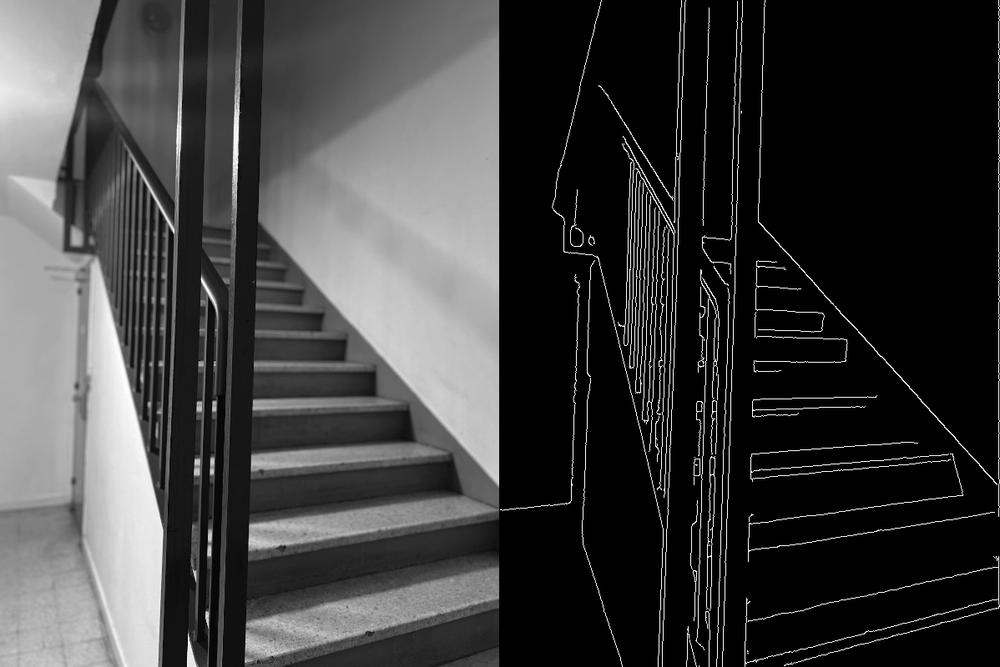

Processing steps: Grayscale | Edges


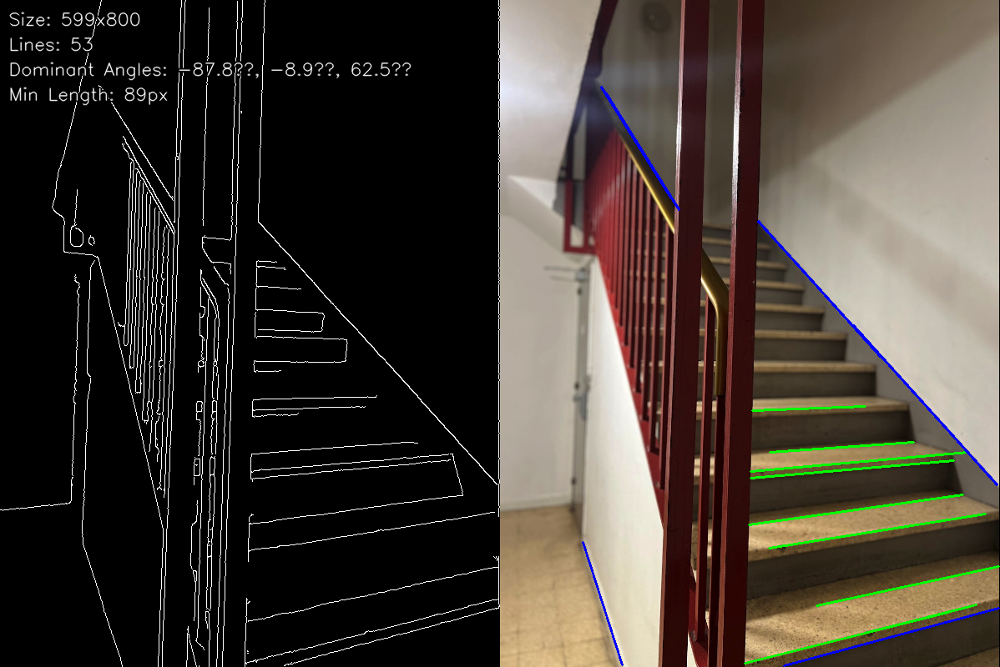

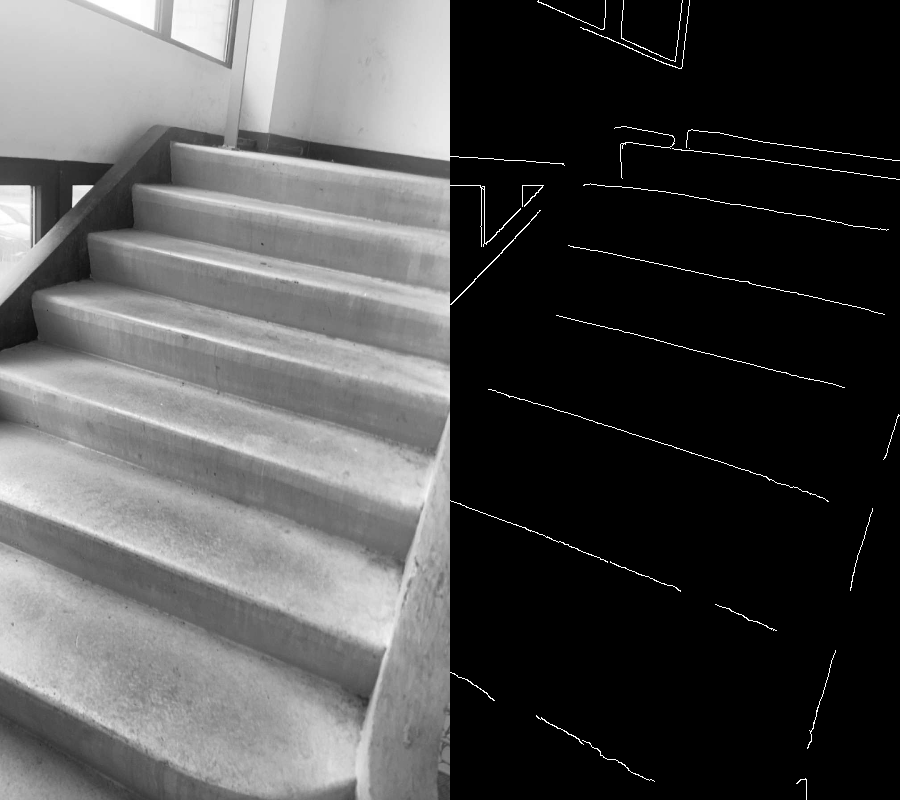

Processing steps: Grayscale | Edges


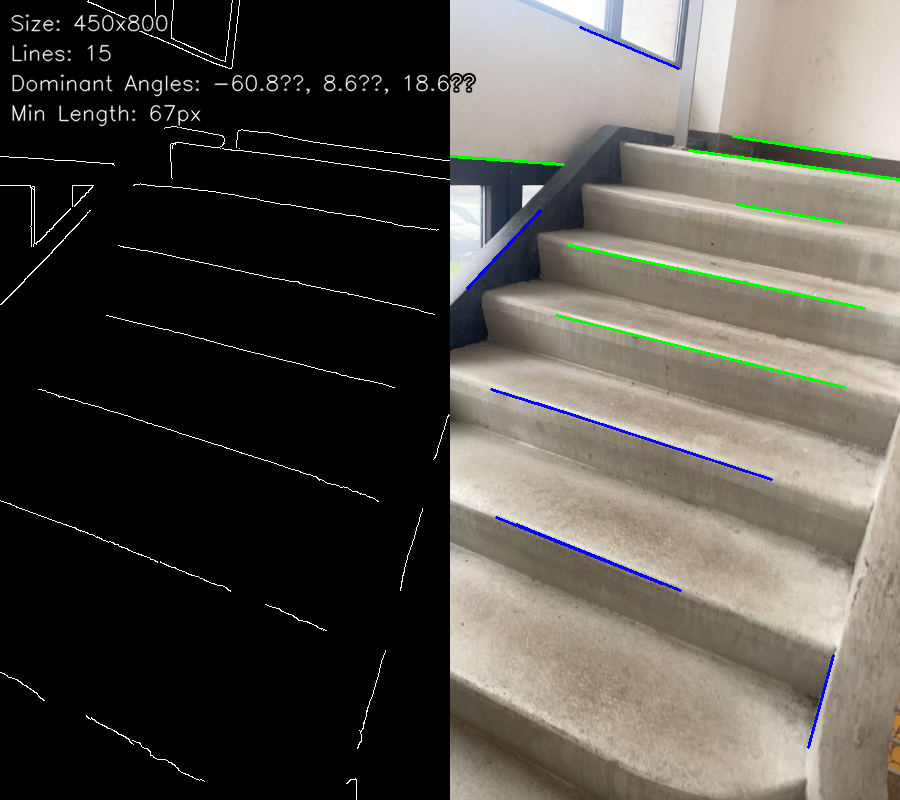

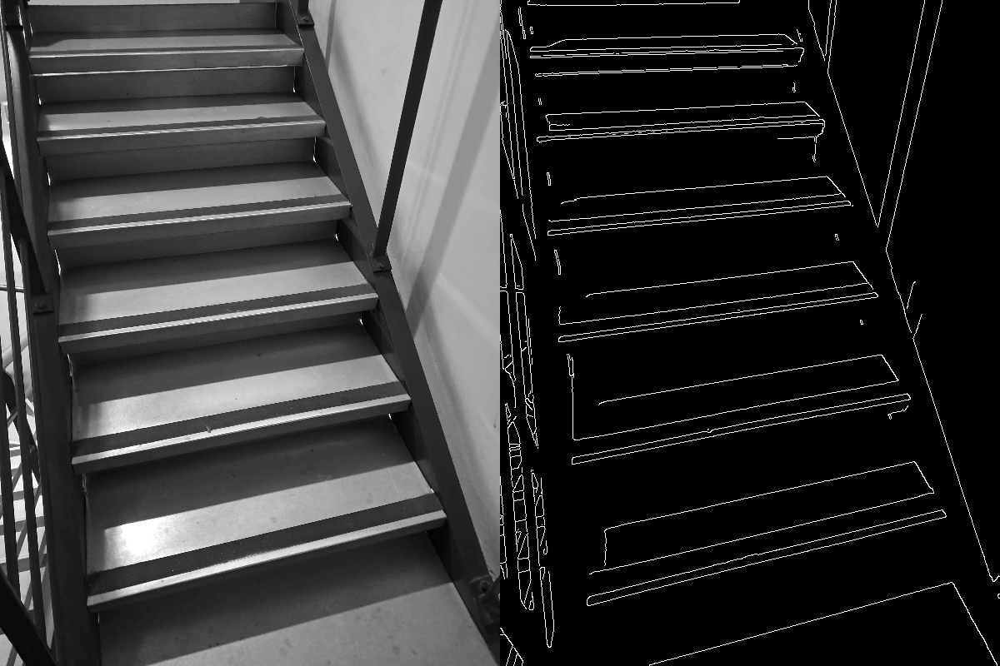

Processing steps: Grayscale | Edges


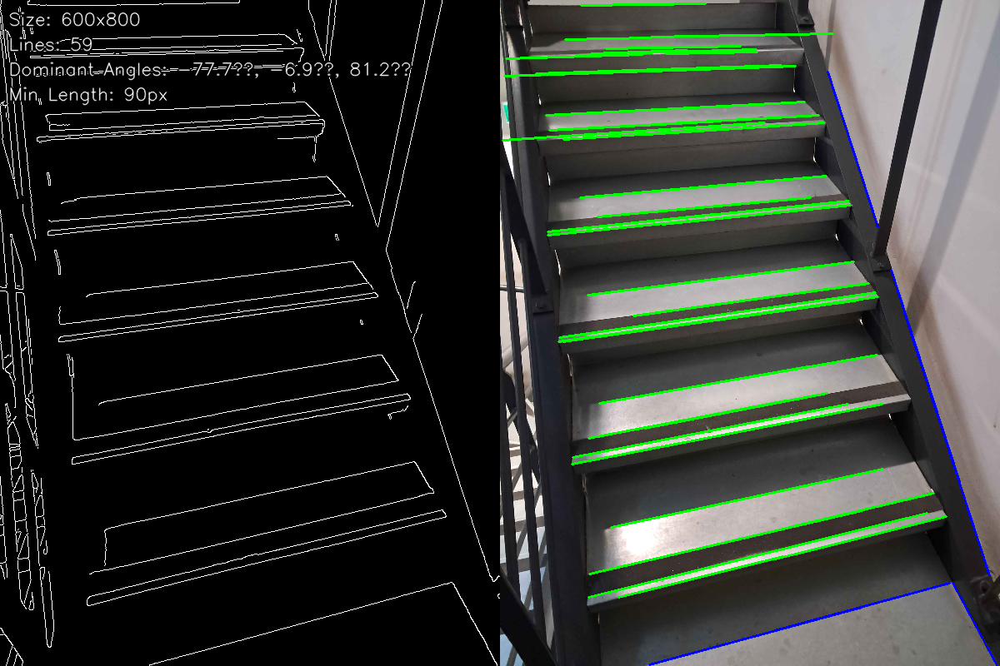

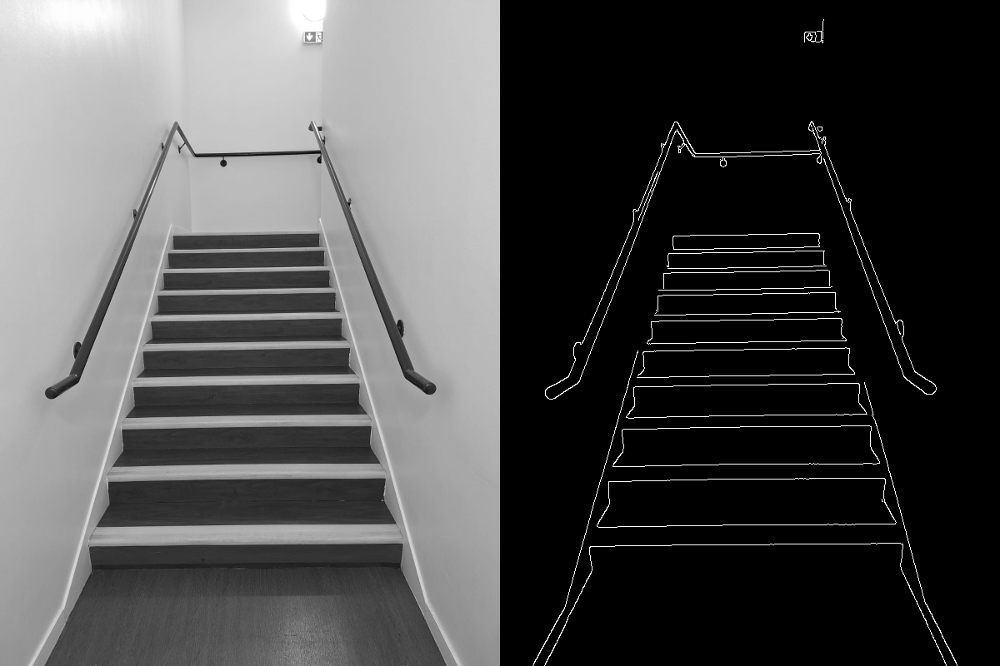

Processing steps: Grayscale | Edges


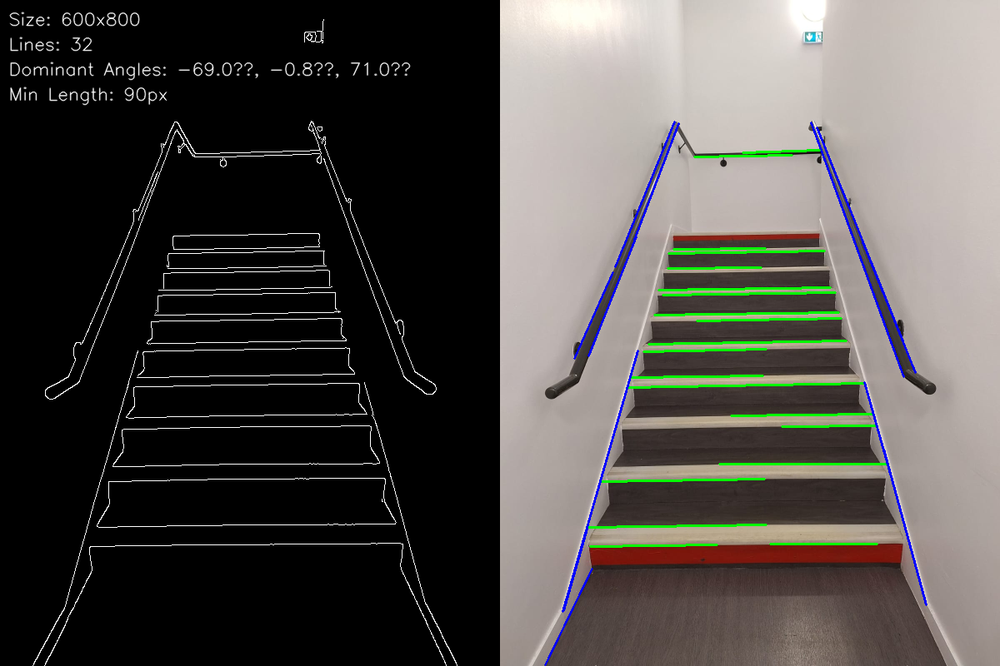

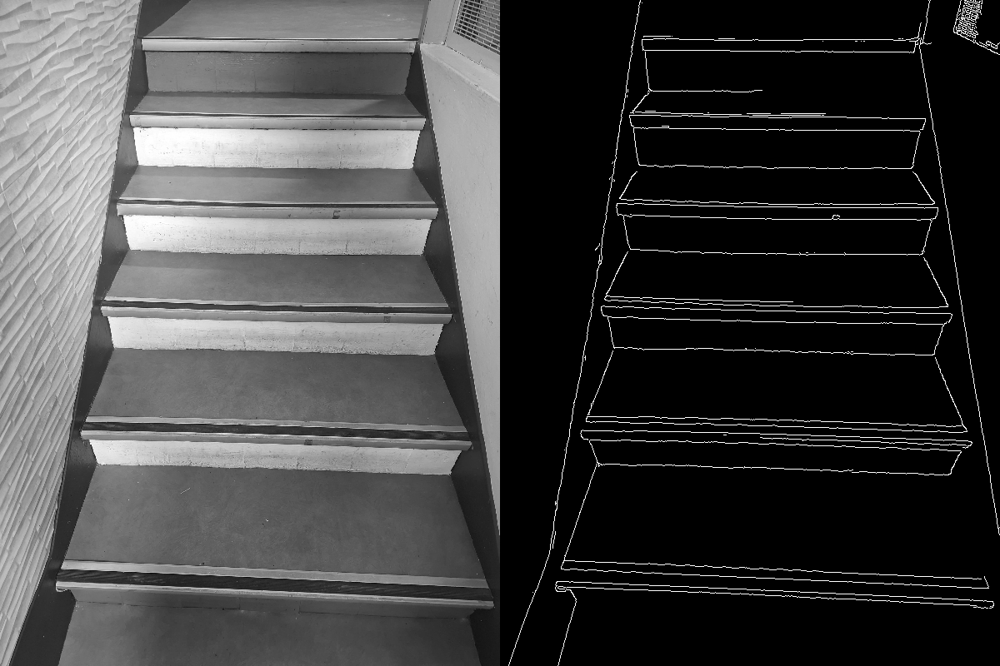

Processing steps: Grayscale | Edges


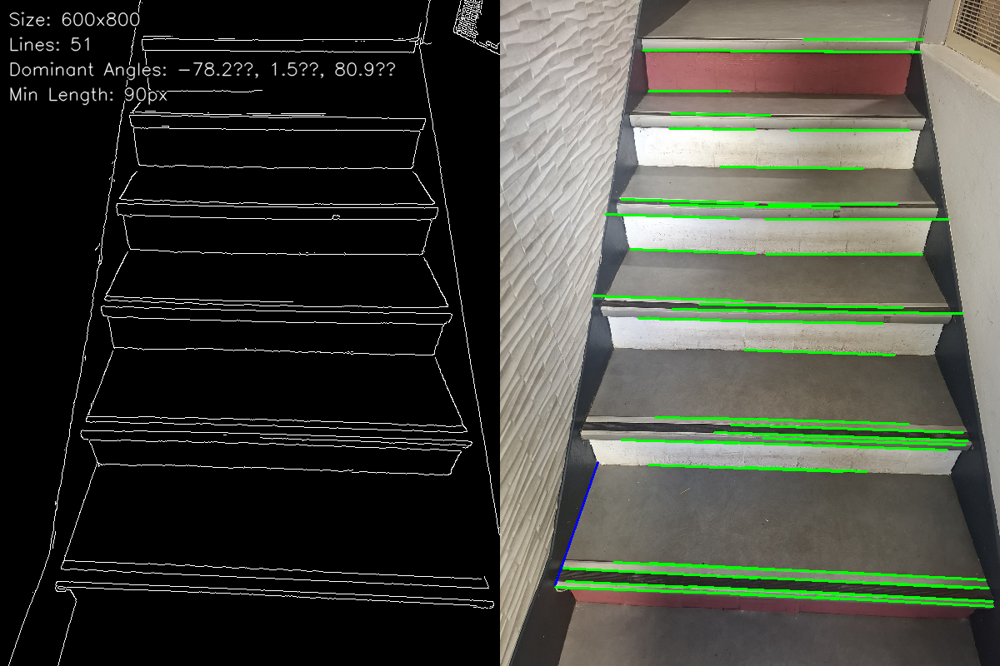

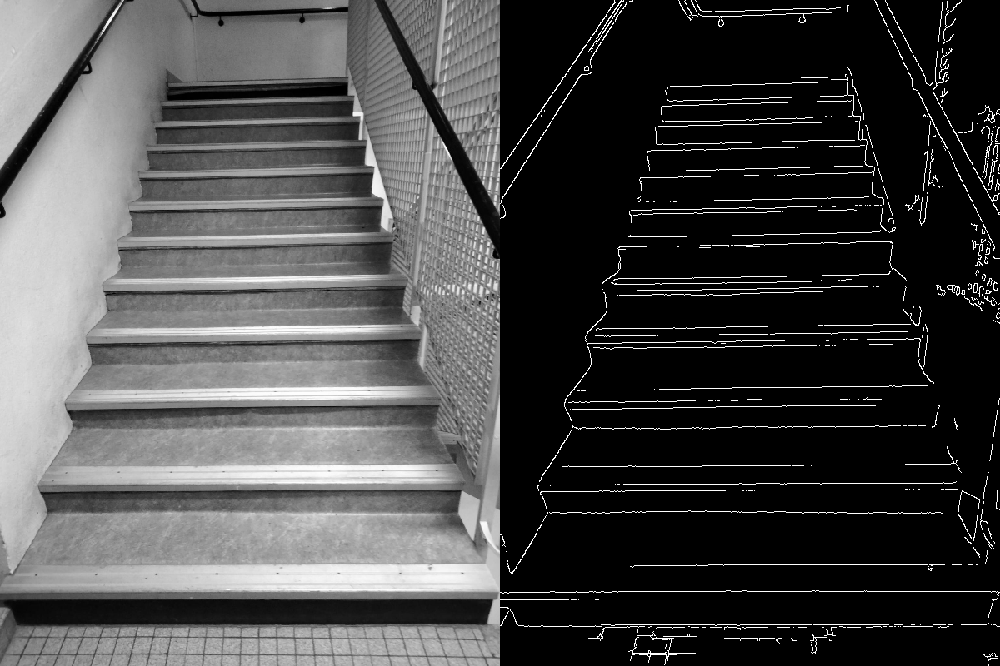

Processing steps: Grayscale | Edges


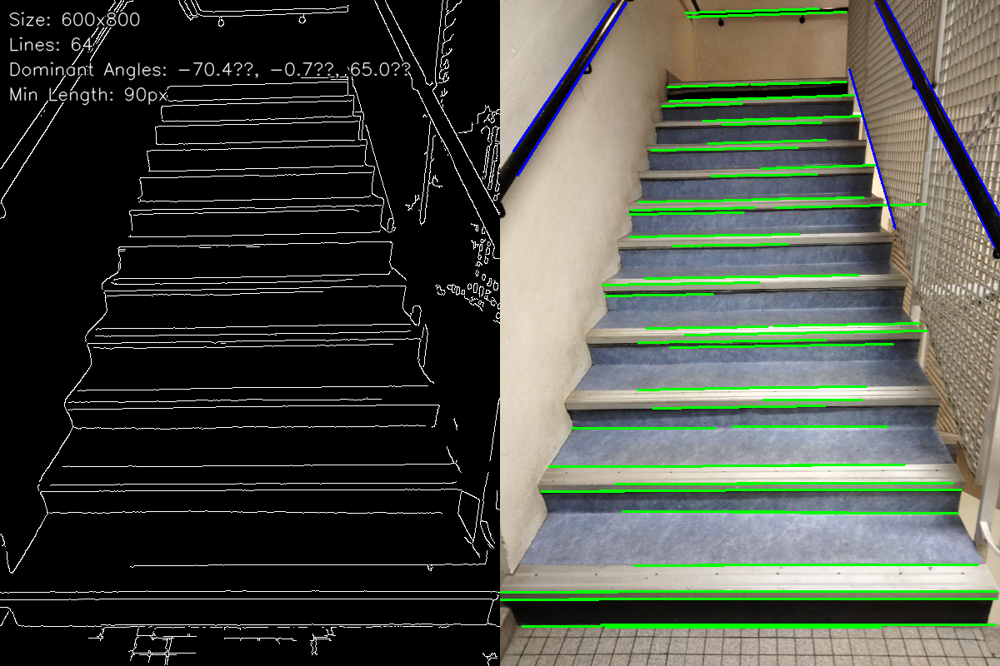

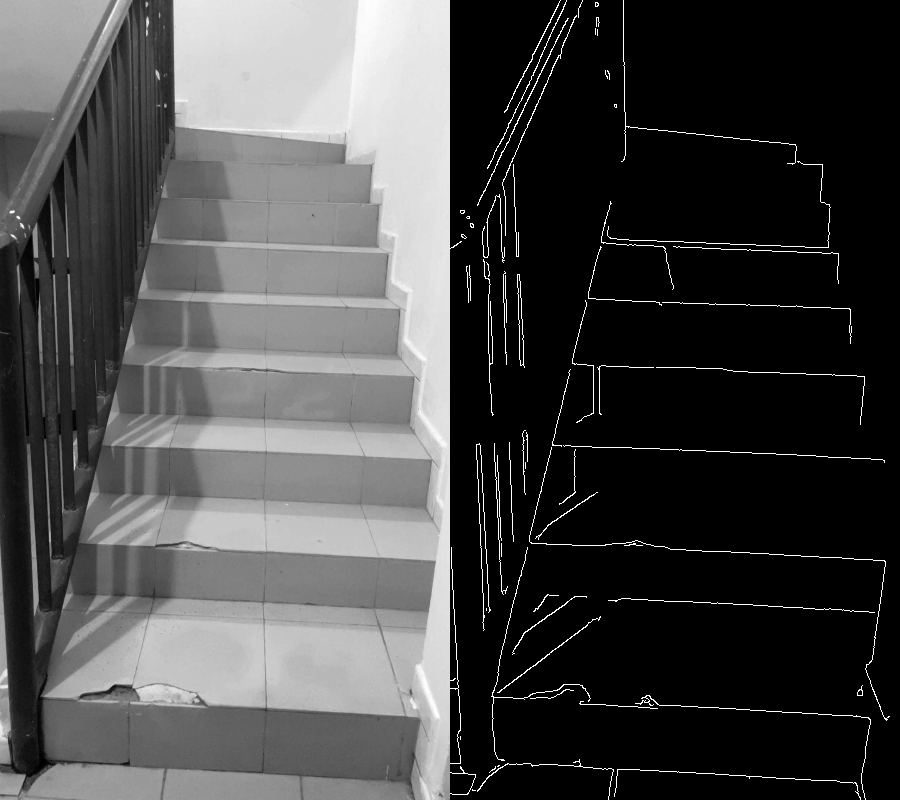

Processing steps: Grayscale | Edges


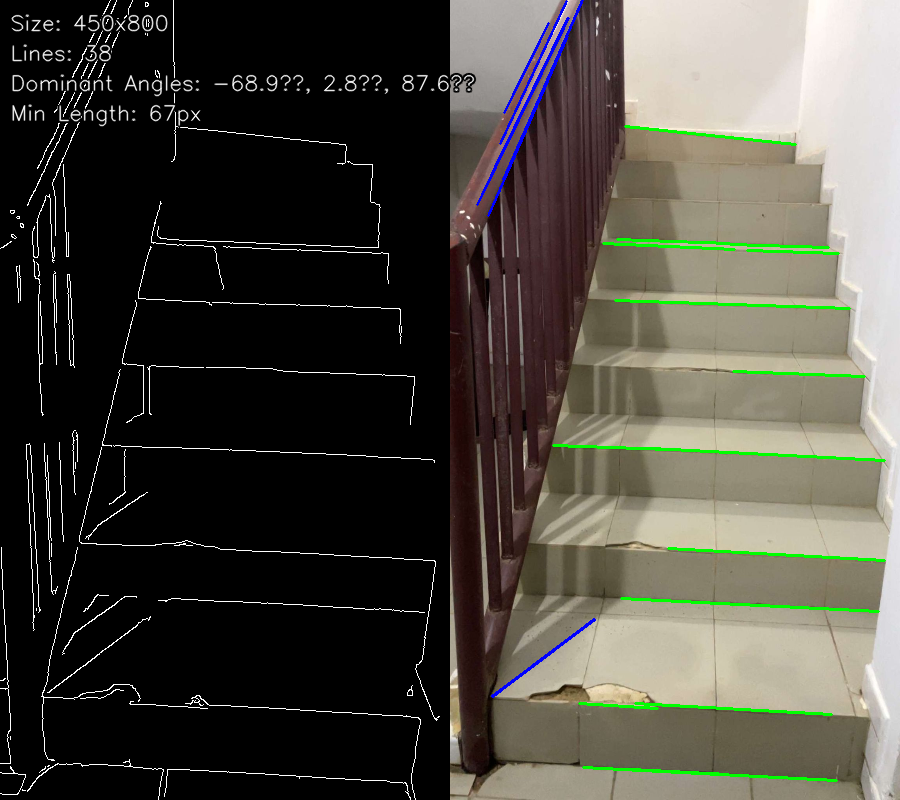

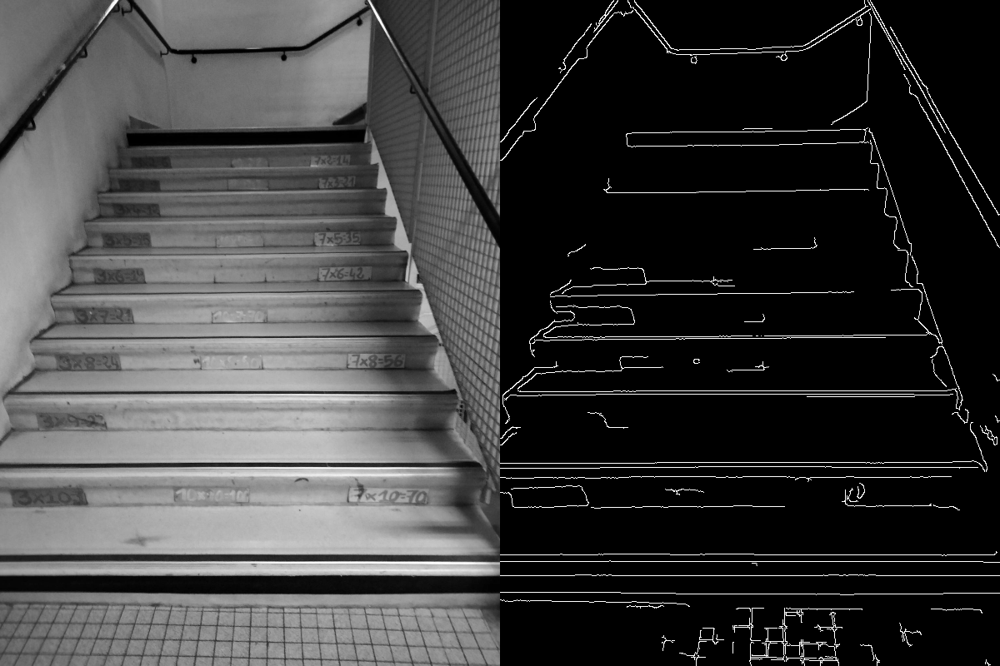

Processing steps: Grayscale | Edges


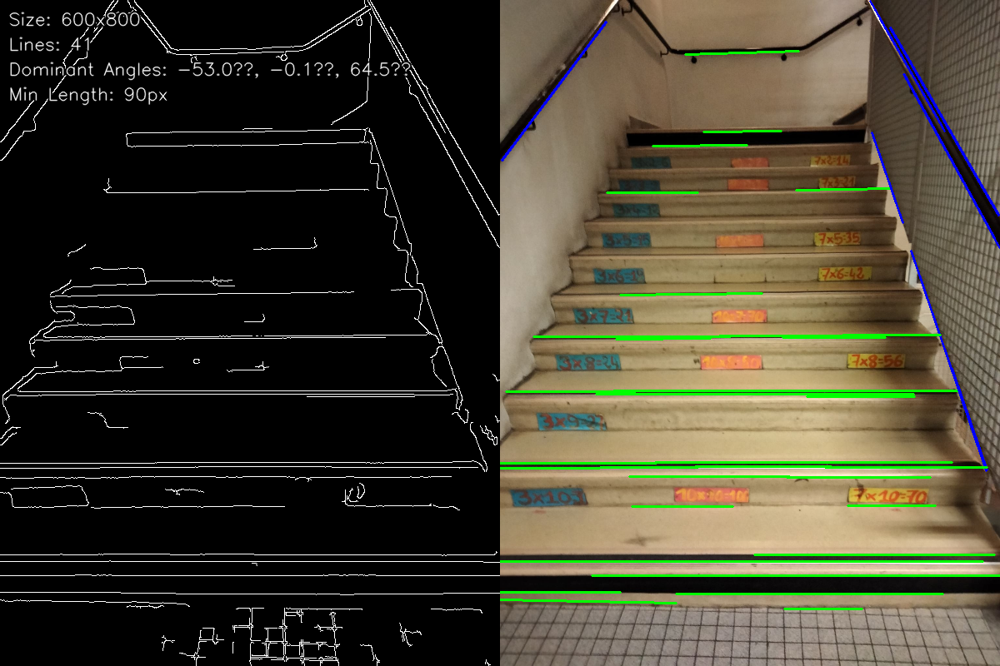

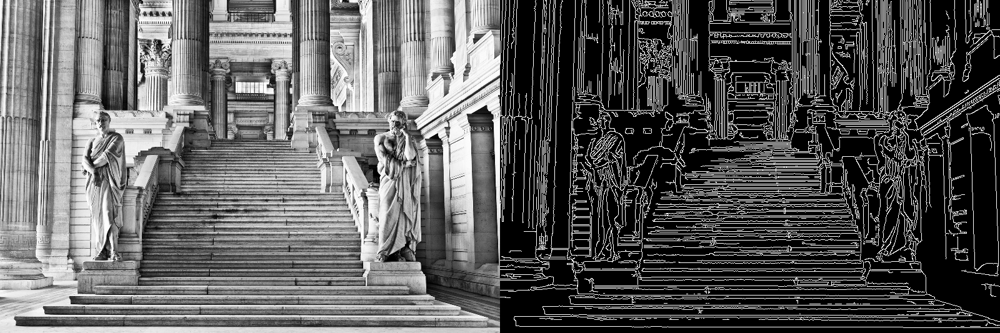

Processing steps: Grayscale | Edges


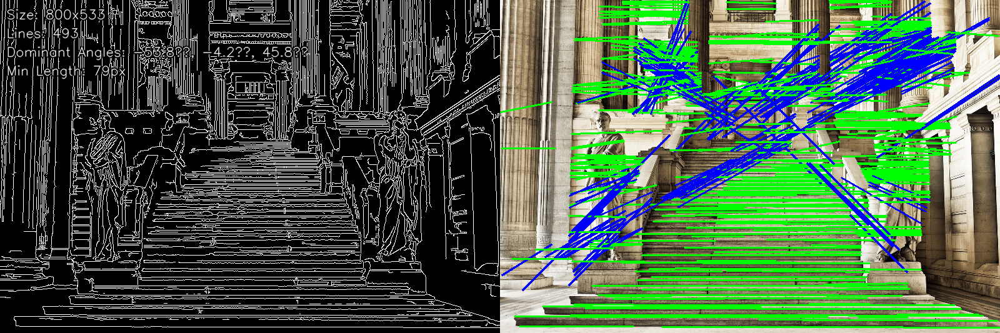

In [8]:
count = 0
for filename in os.listdir(data):
  count += 1
  if filename.endswith(".jpg") or filename.endswith(".png"):  # Adjust extensions as needed
    image_path = os.path.join(data, filename)
    enhanced_perspective_detection(image_path)
    if count == 10:
      break